<a href="https://colab.research.google.com/github/AnishmMore/CountingGrains/blob/main/Counting_objects.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Counting grains in an image.

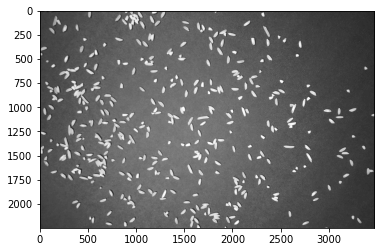

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img=cv2.imread("mixed_grain_1.jpg")
img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(img,cmap='gray')

In [ ]:
output_adapthresh = cv2.adaptiveThreshold (img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 51, -15)

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
output_erosion=cv2.erode(output_adapthresh,kernel,iterations=1)

Counting the broken and normal grains 

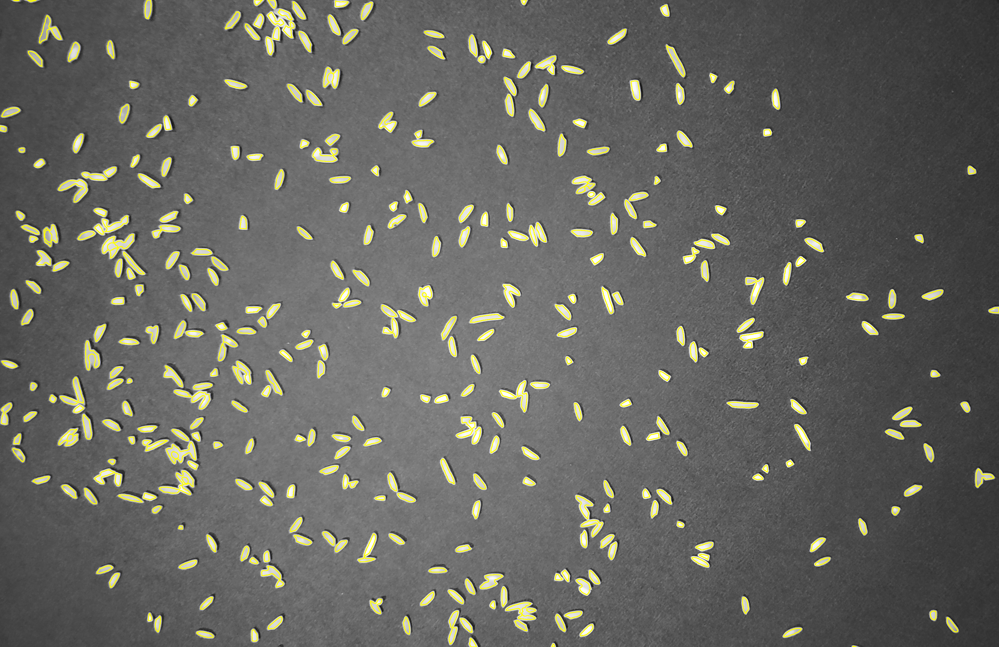

176
203


In [ ]:
from google.colab.patches import cv2_imshow
contours,_ = cv2.findContours(output_erosion, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) 
output_contour = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR) 
j,k=0,0
minArea=800
for i in contours:
    cnt = cv2.contourArea(i)
    if cnt > minArea:  
         cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)  
         j+=1
   
    else:
         cv2.drawContours(output_contour, contours, -1, (0, 255, 255), 2) 
         k+=1
cv2_imshow( output_contour)
print(j)
print(k)

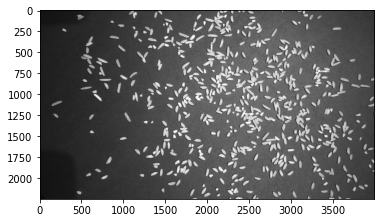

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img=cv2.imread("image_1.jpg")
img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(img,cmap='gray')

In [ ]:
blur=cv2.GaussianBlur(img,(3,3),0)

In [ ]:
output_adapthresh = cv2.adaptiveThreshold (blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 51, -15)

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
output_erosion=cv2.erode(output_adapthresh,kernel,iterations=1)

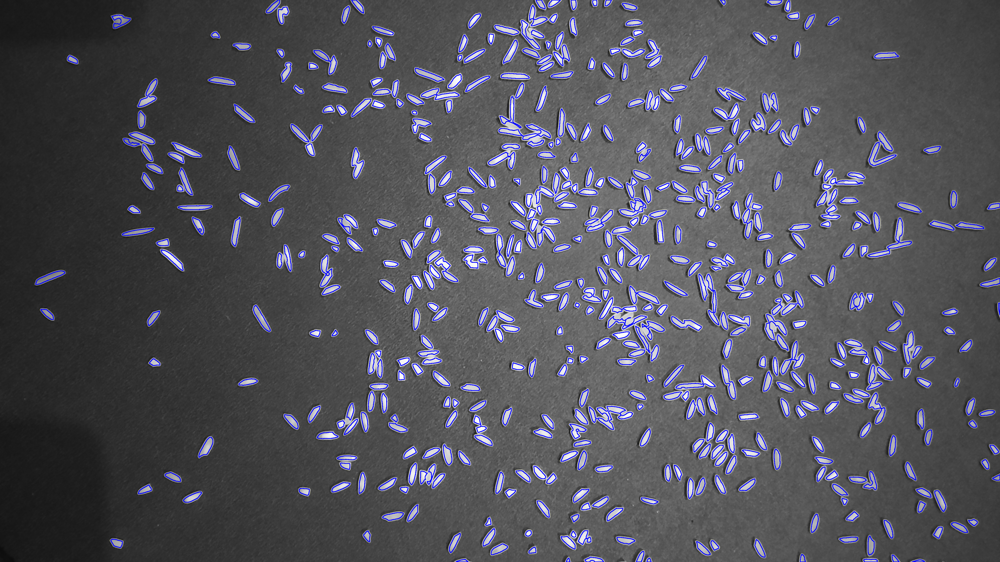

402
175


In [ ]:
from google.colab.patches import cv2_imshow
contours,_ = cv2.findContours(output_erosion, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) 
output_contour = cv2.cvtColor(blur, cv2.COLOR_GRAY2BGR) 
j,k=0,0
minArea=800
for i in contours:
    cnt = cv2.contourArea(i)
    if cnt > minArea:  
         cv2.drawContours(output_contour, contours, -1, (255, 0, 0), 2)  
         j+=1
   
    else:
         cv2.drawContours(output_contour, contours, -1, (0, 255, 255), 2) 
         k+=1
cv2_imshow( output_contour)
print(j) #normal
print(k) #broken